### Imports

In [2]:
import sys
sys.dont_write_bytecode = True


import torch
import numpy as np
import random
import os

def set_seeds(seed_value=42):
    """Sets seeds for reproducibility."""
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed_value)

set_seeds(42) 

import json
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import warnings
import logging
from datetime import datetime
warnings.filterwarnings('ignore')

from model import get_model
from config import CFG
from dataset import get_dataset_class
# from plot import plot_domainwise_accuracy
from transform import get_transforms
from runner import run_baseline, run_lodo

torch.manual_seed(CFG["system"]["seed"])
np.random.seed(CFG["system"]["seed"])

device = CFG["system"]["device"]
print(f"Device: {device}")
print(f"PyTorch: {torch.__version__}")

DS = "PACS"
MODEL_NAME = "WinKawaks/vit-small-patch16-224"

Device: cuda
PyTorch: 2.5.1+cu121


### DataLoading

In [3]:
train_transform, test_transform = get_transforms(img_size=224, augment=False, use_imagenet_norm=False)

DatasetClass = get_dataset_class(DS)

ld = DatasetClass(
    data_root=CFG["datasets"][DS]["root"],
    transform=train_transform,
    batch_size=CFG["train"]["batch_size"]
)

print("\nData loaders ready!")


Data loaders ready!


### Logging

In [4]:
dataset_name = DS
base_dir = os.path.join(os.getcwd(), dataset_name)
subdirs = ["logs", "checkpoints", "plots"]

for sub in subdirs:
    os.makedirs(os.path.join(base_dir, sub), exist_ok=True)

timestamp = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
log_file = os.path.join(base_dir, "logs", f"train_{timestamp}.log")

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s | %(levelname)s | %(message)s",
    handlers=[
        logging.FileHandler(log_file),
        logging.StreamHandler()
    ]
)

logger = logging.getLogger(f"{dataset_name}_logger")

logger.info(f"Initialized experiment directories for {dataset_name}")
logger.info(f"Logs: {os.path.join(base_dir, 'logs')}")
logger.info(f"Checkpoints: {os.path.join(base_dir, 'checkpoints')}")
logger.info(f"Plots: {os.path.join(base_dir, 'plots')}")

2025-10-20 08:07:20,231 | INFO | Initialized experiment directories for PACS
2025-10-20 08:07:20,232 | INFO | Logs: c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-small\PACS\logs
2025-10-20 08:07:20,232 | INFO | Checkpoints: c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-small\PACS\checkpoints
2025-10-20 08:07:20,232 | INFO | Plots: c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-small\PACS\plots


### Setup

In [5]:
domains = CFG["datasets"][DS]["domains"]
loaders = {d: {"train": ld.get_dataloader(d, train=True), "val": ld.get_dataloader(d, train=False)} for d in domains}
ckpt_root = os.path.join(base_dir, "checkpoints")
log_dir = os.path.join(base_dir, "logs")
plots_dir = os.path.join(base_dir, "plots")
os.makedirs(ckpt_root, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)
os.makedirs(plots_dir, exist_ok=True)
model_factory = lambda cfg, dataset_key: get_model(cfg,dataset=DS)
optimizer_fn = lambda model: optim.AdamW(model.parameters(), lr=CFG["train"]["lr"], weight_decay=CFG["train"].get("weight_decay", 0.01))
device = CFG["system"]["device"]
epochs = CFG["train"]["epochs"]


{
  "lodo_results": {
    "art_painting": 0.8341463414634146,
    "cartoon": 0.7974413646055437,
    "photo": 0.9580838323353293,
    "sketch": 0.6017811704834606
  },
  "timestamp": "20251004_020611"
}

### Leave One Domain Out

In [6]:
lodo_results, lodo_mean, lodo_summary = run_lodo(
    model_fn=model_factory,
    CFG=CFG,
    logger=logger,
    dataset_key=DS,
    domains=domains,
    loaders=loaders,
    optimizer_fn=optimizer_fn,
    device=device,
    ckpt_root=ckpt_root,
    log_dir=log_dir,
    epochs=epochs
)

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
2025-10-20 08:07:27,336 | WARNING | Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:07:31,693 | INFO | === LODO: Leaving out domain 'art_painting' ===



=== LODO: Leaving out domain 'art_painting' ===


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.38it/s]
2025-10-20 08:08:05,429 | INFO | [art_painting] Epoch 1/5 | Train - Loss: 0.5071, Cls: 0.4990, GRQO: 0.0081, Acc: 0.8317 | Val - Loss: 0.3084, Cls: 0.3071, GRQO: 0.0013, Acc: 0.9009
2025-10-20 08:08:05,530 | INFO | [art_painting] New best val acc: 0.9009


[art_painting] Epoch 1/5 | Train - Loss: 0.5071, Cls: 0.4990, GRQO: 0.0081, Acc: 0.8317 | Val - Loss: 0.3084, Cls: 0.3071, GRQO: 0.0013, Acc: 0.9009
[art_painting] New best val acc: 0.9009


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.23it/s]
2025-10-20 08:08:31,633 | INFO | [art_painting] Epoch 2/5 | Train - Loss: 0.0866, Cls: 0.0840, GRQO: 0.0026, Acc: 0.9723 | Val - Loss: 0.2972, Cls: 0.2964, GRQO: 0.0008, Acc: 0.9117
2025-10-20 08:08:31,732 | INFO | [art_painting] New best val acc: 0.9117


[art_painting] Epoch 2/5 | Train - Loss: 0.0866, Cls: 0.0840, GRQO: 0.0026, Acc: 0.9723 | Val - Loss: 0.2972, Cls: 0.2964, GRQO: 0.0008, Acc: 0.9117
[art_painting] New best val acc: 0.9117


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.12it/s]
2025-10-20 08:08:57,998 | INFO | [art_painting] Epoch 3/5 | Train - Loss: 0.0232, Cls: 0.0210, GRQO: 0.0022, Acc: 0.9929 | Val - Loss: 0.2749, Cls: 0.2743, GRQO: 0.0006, Acc: 0.9215
2025-10-20 08:08:58,102 | INFO | [art_painting] New best val acc: 0.9215


[art_painting] Epoch 3/5 | Train - Loss: 0.0232, Cls: 0.0210, GRQO: 0.0022, Acc: 0.9929 | Val - Loss: 0.2749, Cls: 0.2743, GRQO: 0.0006, Acc: 0.9215
[art_painting] New best val acc: 0.9215


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
2025-10-20 08:09:24,340 | INFO | [art_painting] Epoch 4/5 | Train - Loss: 0.0916, Cls: 0.0896, GRQO: 0.0020, Acc: 0.9722 | Val - Loss: 0.2947, Cls: 0.2943, GRQO: 0.0005, Acc: 0.9136


[art_painting] Epoch 4/5 | Train - Loss: 0.0916, Cls: 0.0896, GRQO: 0.0020, Acc: 0.9722 | Val - Loss: 0.2947, Cls: 0.2943, GRQO: 0.0005, Acc: 0.9136


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
2025-10-20 08:09:50,611 | INFO | [art_painting] Epoch 5/5 | Train - Loss: 0.0156, Cls: 0.0139, GRQO: 0.0017, Acc: 0.9955 | Val - Loss: 0.3389, Cls: 0.3385, GRQO: 0.0004, Acc: 0.9073
2025-10-20 08:09:50,611 | INFO | [art_painting] Best Acc: 0.9215
2025-10-20 08:09:50,611 | INFO | ------------------------------------------------------------


[art_painting] Epoch 5/5 | Train - Loss: 0.0156, Cls: 0.0139, GRQO: 0.0017, Acc: 0.9955 | Val - Loss: 0.3389, Cls: 0.3385, GRQO: 0.0004, Acc: 0.9073
[art_painting] Best Acc: 0.9215
------------------------------------------------------------


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:09:51,396 | INFO | === LODO: Leaving out domain 'cartoon' ===



=== LODO: Leaving out domain 'cartoon' ===


Evaluating: 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]
2025-10-20 08:10:17,585 | INFO | [cartoon] Epoch 1/5 | Train - Loss: 0.4832, Cls: 0.4766, GRQO: 0.0066, Acc: 0.8440 | Val - Loss: 0.5683, Cls: 0.5669, GRQO: 0.0014, Acc: 0.7935
2025-10-20 08:10:17,663 | INFO | [cartoon] New best val acc: 0.7935


[cartoon] Epoch 1/5 | Train - Loss: 0.4832, Cls: 0.4766, GRQO: 0.0066, Acc: 0.8440 | Val - Loss: 0.5683, Cls: 0.5669, GRQO: 0.0014, Acc: 0.7935
[cartoon] New best val acc: 0.7935


Evaluating: 100%|██████████| 19/19 [00:04<00:00,  4.40it/s]
2025-10-20 08:10:43,797 | INFO | [cartoon] Epoch 2/5 | Train - Loss: 0.0774, Cls: 0.0748, GRQO: 0.0026, Acc: 0.9768 | Val - Loss: 0.5402, Cls: 0.5391, GRQO: 0.0012, Acc: 0.8161
2025-10-20 08:10:43,894 | INFO | [cartoon] New best val acc: 0.8161


[cartoon] Epoch 2/5 | Train - Loss: 0.0774, Cls: 0.0748, GRQO: 0.0026, Acc: 0.9768 | Val - Loss: 0.5402, Cls: 0.5391, GRQO: 0.0012, Acc: 0.8161
[cartoon] New best val acc: 0.8161


Evaluating: 100%|██████████| 19/19 [00:04<00:00,  4.38it/s]
2025-10-20 08:11:09,956 | INFO | [cartoon] Epoch 3/5 | Train - Loss: 0.0289, Cls: 0.0267, GRQO: 0.0022, Acc: 0.9919 | Val - Loss: 0.5989, Cls: 0.5981, GRQO: 0.0008, Acc: 0.8225
2025-10-20 08:11:10,048 | INFO | [cartoon] New best val acc: 0.8225


[cartoon] Epoch 3/5 | Train - Loss: 0.0289, Cls: 0.0267, GRQO: 0.0022, Acc: 0.9919 | Val - Loss: 0.5989, Cls: 0.5981, GRQO: 0.0008, Acc: 0.8225
[cartoon] New best val acc: 0.8225


Evaluating: 100%|██████████| 19/19 [00:04<00:00,  4.44it/s]
2025-10-20 08:11:36,030 | INFO | [cartoon] Epoch 4/5 | Train - Loss: 0.0118, Cls: 0.0099, GRQO: 0.0019, Acc: 0.9963 | Val - Loss: 0.6954, Cls: 0.6948, GRQO: 0.0006, Acc: 0.8217


[cartoon] Epoch 4/5 | Train - Loss: 0.0118, Cls: 0.0099, GRQO: 0.0019, Acc: 0.9963 | Val - Loss: 0.6954, Cls: 0.6948, GRQO: 0.0006, Acc: 0.8217


Evaluating: 100%|██████████| 19/19 [00:05<00:00,  3.49it/s]
2025-10-20 08:12:04,583 | INFO | [cartoon] Epoch 5/5 | Train - Loss: 0.0209, Cls: 0.0192, GRQO: 0.0017, Acc: 0.9952 | Val - Loss: 0.5910, Cls: 0.5904, GRQO: 0.0005, Acc: 0.8379
2025-10-20 08:12:04,693 | INFO | [cartoon] New best val acc: 0.8379
2025-10-20 08:12:04,693 | INFO | [cartoon] Best Acc: 0.8379
2025-10-20 08:12:04,693 | INFO | ------------------------------------------------------------


[cartoon] Epoch 5/5 | Train - Loss: 0.0209, Cls: 0.0192, GRQO: 0.0017, Acc: 0.9952 | Val - Loss: 0.5910, Cls: 0.5904, GRQO: 0.0005, Acc: 0.8379
[cartoon] New best val acc: 0.8379
[cartoon] Best Acc: 0.8379
------------------------------------------------------------


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:12:05,487 | INFO | === LODO: Leaving out domain 'photo' ===



=== LODO: Leaving out domain 'photo' ===


Evaluating: 100%|██████████| 14/14 [00:03<00:00,  4.03it/s]
2025-10-20 08:12:33,295 | INFO | [photo] Epoch 1/5 | Train - Loss: 0.4816, Cls: 0.4735, GRQO: 0.0081, Acc: 0.8468 | Val - Loss: 0.0357, Cls: 0.0345, GRQO: 0.0012, Acc: 0.9952
2025-10-20 08:12:33,395 | INFO | [photo] New best val acc: 0.9952


[photo] Epoch 1/5 | Train - Loss: 0.4816, Cls: 0.4735, GRQO: 0.0081, Acc: 0.8468 | Val - Loss: 0.0357, Cls: 0.0345, GRQO: 0.0012, Acc: 0.9952
[photo] New best val acc: 0.9952


Evaluating: 100%|██████████| 14/14 [00:03<00:00,  4.16it/s]
2025-10-20 08:13:01,364 | INFO | [photo] Epoch 2/5 | Train - Loss: 0.0654, Cls: 0.0630, GRQO: 0.0024, Acc: 0.9800 | Val - Loss: 0.0275, Cls: 0.0268, GRQO: 0.0008, Acc: 0.9946


[photo] Epoch 2/5 | Train - Loss: 0.0654, Cls: 0.0630, GRQO: 0.0024, Acc: 0.9800 | Val - Loss: 0.0275, Cls: 0.0268, GRQO: 0.0008, Acc: 0.9946


Evaluating: 100%|██████████| 14/14 [00:03<00:00,  4.15it/s]
2025-10-20 08:13:28,748 | INFO | [photo] Epoch 3/5 | Train - Loss: 0.0369, Cls: 0.0349, GRQO: 0.0020, Acc: 0.9888 | Val - Loss: 0.0292, Cls: 0.0287, GRQO: 0.0005, Acc: 0.9916


[photo] Epoch 3/5 | Train - Loss: 0.0369, Cls: 0.0349, GRQO: 0.0020, Acc: 0.9888 | Val - Loss: 0.0292, Cls: 0.0287, GRQO: 0.0005, Acc: 0.9916


Evaluating: 100%|██████████| 14/14 [00:03<00:00,  4.22it/s]
2025-10-20 08:13:56,348 | INFO | [photo] Epoch 4/5 | Train - Loss: 0.0201, Cls: 0.0184, GRQO: 0.0018, Acc: 0.9931 | Val - Loss: 0.0287, Cls: 0.0284, GRQO: 0.0003, Acc: 0.9916


[photo] Epoch 4/5 | Train - Loss: 0.0201, Cls: 0.0184, GRQO: 0.0018, Acc: 0.9931 | Val - Loss: 0.0287, Cls: 0.0284, GRQO: 0.0003, Acc: 0.9916


Evaluating: 100%|██████████| 14/14 [00:03<00:00,  4.06it/s]
2025-10-20 08:14:23,898 | INFO | [photo] Epoch 5/5 | Train - Loss: 0.0181, Cls: 0.0165, GRQO: 0.0016, Acc: 0.9948 | Val - Loss: 0.0309, Cls: 0.0306, GRQO: 0.0003, Acc: 0.9928
2025-10-20 08:14:23,898 | INFO | [photo] Best Acc: 0.9952
2025-10-20 08:14:23,898 | INFO | ------------------------------------------------------------


[photo] Epoch 5/5 | Train - Loss: 0.0181, Cls: 0.0165, GRQO: 0.0016, Acc: 0.9948 | Val - Loss: 0.0309, Cls: 0.0306, GRQO: 0.0003, Acc: 0.9928
[photo] Best Acc: 0.9952
------------------------------------------------------------


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:14:24,756 | INFO | === LODO: Leaving out domain 'sketch' ===



=== LODO: Leaving out domain 'sketch' ===


Evaluating: 100%|██████████| 31/31 [00:22<00:00,  1.36it/s]
2025-10-20 08:15:05,195 | INFO | [sketch] Epoch 1/5 | Train - Loss: 0.4584, Cls: 0.4494, GRQO: 0.0090, Acc: 0.8736 | Val - Loss: 1.0944, Cls: 1.0932, GRQO: 0.0012, Acc: 0.6745
2025-10-20 08:15:05,310 | INFO | [sketch] New best val acc: 0.6745


[sketch] Epoch 1/5 | Train - Loss: 0.4584, Cls: 0.4494, GRQO: 0.0090, Acc: 0.8736 | Val - Loss: 1.0944, Cls: 1.0932, GRQO: 0.0012, Acc: 0.6745
[sketch] New best val acc: 0.6745


Evaluating: 100%|██████████| 31/31 [00:22<00:00,  1.36it/s]
2025-10-20 08:16:09,411 | INFO | [sketch] Epoch 2/5 | Train - Loss: 0.0402, Cls: 0.0375, GRQO: 0.0027, Acc: 0.9894 | Val - Loss: 0.9952, Cls: 0.9943, GRQO: 0.0009, Acc: 0.6806
2025-10-20 08:16:09,528 | INFO | [sketch] New best val acc: 0.6806


[sketch] Epoch 2/5 | Train - Loss: 0.0402, Cls: 0.0375, GRQO: 0.0027, Acc: 0.9894 | Val - Loss: 0.9952, Cls: 0.9943, GRQO: 0.0009, Acc: 0.6806
[sketch] New best val acc: 0.6806


Evaluating: 100%|██████████| 31/31 [00:22<00:00,  1.37it/s]
2025-10-20 08:17:12,759 | INFO | [sketch] Epoch 3/5 | Train - Loss: 0.0129, Cls: 0.0106, GRQO: 0.0023, Acc: 0.9977 | Val - Loss: 1.0678, Cls: 1.0670, GRQO: 0.0007, Acc: 0.7116
2025-10-20 08:17:12,876 | INFO | [sketch] New best val acc: 0.7116


[sketch] Epoch 3/5 | Train - Loss: 0.0129, Cls: 0.0106, GRQO: 0.0023, Acc: 0.9977 | Val - Loss: 1.0678, Cls: 1.0670, GRQO: 0.0007, Acc: 0.7116
[sketch] New best val acc: 0.7116


Evaluating: 100%|██████████| 31/31 [00:22<00:00,  1.35it/s]
2025-10-20 08:18:16,690 | INFO | [sketch] Epoch 4/5 | Train - Loss: 0.0051, Cls: 0.0032, GRQO: 0.0020, Acc: 0.9993 | Val - Loss: 1.2284, Cls: 1.2278, GRQO: 0.0007, Acc: 0.7009


[sketch] Epoch 4/5 | Train - Loss: 0.0051, Cls: 0.0032, GRQO: 0.0020, Acc: 0.9993 | Val - Loss: 1.2284, Cls: 1.2278, GRQO: 0.0007, Acc: 0.7009


Evaluating: 100%|██████████| 31/31 [00:22<00:00,  1.36it/s]
2025-10-20 08:19:20,177 | INFO | [sketch] Epoch 5/5 | Train - Loss: 0.0034, Cls: 0.0016, GRQO: 0.0018, Acc: 0.9997 | Val - Loss: 0.8929, Cls: 0.8924, GRQO: 0.0005, Acc: 0.7679
2025-10-20 08:19:20,294 | INFO | [sketch] New best val acc: 0.7679
2025-10-20 08:19:20,294 | INFO | [sketch] Best Acc: 0.7679
2025-10-20 08:19:20,294 | INFO | ------------------------------------------------------------
2025-10-20 08:19:20,294 | INFO | LODO finished | Mean Acc: 0.8806 | Summary saved to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-small\PACS\logs\lodo_summary_20251020_081920.json


[sketch] Epoch 5/5 | Train - Loss: 0.0034, Cls: 0.0016, GRQO: 0.0018, Acc: 0.9997 | Val - Loss: 0.8929, Cls: 0.8924, GRQO: 0.0005, Acc: 0.7679
[sketch] New best val acc: 0.7679
[sketch] Best Acc: 0.7679
------------------------------------------------------------
LODO finished | Mean Acc: 0.8806
Summary saved to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-small\PACS\logs\lodo_summary_20251020_081920.json


### Baseline

In [7]:
baseline_results, baseline_mean = run_baseline(
    model_name=MODEL_NAME,
    CFG=CFG,
    logger=logger,
    dataset_key=DS,
    domains=domains,
    loaders=loaders,
    optimizer_fn=optimizer_fn,
    device=device,
    epochs=CFG["train"]["epochs"]
)


2025-10-20 08:19:20,331 | INFO | Initializing ViT baseline: WinKawaks/vit-small-patch16-224


Initializing ViT baseline: WinKawaks/vit-small-patch16-224


Some weights of ViTForImageClassification were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([7]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 384]) in the checkpoint and torch.Size([7, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:19:21,261 | INFO | === Baseline LODO: Leaving out domain 'art_painting' ===



=== Baseline LODO: Leaving out domain 'art_painting' ===


2025-10-20 08:20:24,516 | INFO | [art_painting] Epoch 1/5 | Train - Loss: 0.4255, Acc: 0.8448 | Val Acc: 0.8960


[art_painting] Epoch 1/5 | Train - Loss: 0.4255, Acc: 0.8448 | Val Acc: 0.8960


2025-10-20 08:21:27,804 | INFO | [art_painting] Epoch 2/5 | Train - Loss: 0.0735, Acc: 0.9767 | Val Acc: 0.9068


[art_painting] Epoch 2/5 | Train - Loss: 0.0735, Acc: 0.9767 | Val Acc: 0.9068


2025-10-20 08:22:30,887 | INFO | [art_painting] Epoch 3/5 | Train - Loss: 0.0134, Acc: 0.9972 | Val Acc: 0.9225


[art_painting] Epoch 3/5 | Train - Loss: 0.0134, Acc: 0.9972 | Val Acc: 0.9225


2025-10-20 08:23:33,878 | INFO | [art_painting] Epoch 4/5 | Train - Loss: 0.0032, Acc: 0.9994 | Val Acc: 0.9230


[art_painting] Epoch 4/5 | Train - Loss: 0.0032, Acc: 0.9994 | Val Acc: 0.9230


2025-10-20 08:24:37,143 | INFO | [art_painting] Epoch 5/5 | Train - Loss: 0.0010, Acc: 1.0000 | Val Acc: 0.9284
2025-10-20 08:24:37,143 | INFO | [art_painting] Best Val Acc: 0.9284
2025-10-20 08:24:37,143 | INFO | ------------------------------------------------------------
2025-10-20 08:24:37,143 | INFO | Initializing ViT baseline: WinKawaks/vit-small-patch16-224


[art_painting] Epoch 5/5 | Train - Loss: 0.0010, Acc: 1.0000 | Val Acc: 0.9284
[art_painting] Best Val Acc: 0.9284
------------------------------------------------------------
Initializing ViT baseline: WinKawaks/vit-small-patch16-224


Some weights of ViTForImageClassification were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([7]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 384]) in the checkpoint and torch.Size([7, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:24:39,990 | INFO | === Baseline LODO: Leaving out domain 'cartoon' ===



=== Baseline LODO: Leaving out domain 'cartoon' ===


2025-10-20 08:25:43,327 | INFO | [cartoon] Epoch 1/5 | Train - Loss: 0.3065, Acc: 0.8952 | Val Acc: 0.8387


[cartoon] Epoch 1/5 | Train - Loss: 0.3065, Acc: 0.8952 | Val Acc: 0.8387


2025-10-20 08:26:46,640 | INFO | [cartoon] Epoch 2/5 | Train - Loss: 0.0393, Acc: 0.9883 | Val Acc: 0.7880


[cartoon] Epoch 2/5 | Train - Loss: 0.0393, Acc: 0.9883 | Val Acc: 0.7880


2025-10-20 08:27:50,265 | INFO | [cartoon] Epoch 3/5 | Train - Loss: 0.0094, Acc: 0.9979 | Val Acc: 0.8127


[cartoon] Epoch 3/5 | Train - Loss: 0.0094, Acc: 0.9979 | Val Acc: 0.8127


2025-10-20 08:28:53,091 | INFO | [cartoon] Epoch 4/5 | Train - Loss: 0.0053, Acc: 0.9988 | Val Acc: 0.8148


[cartoon] Epoch 4/5 | Train - Loss: 0.0053, Acc: 0.9988 | Val Acc: 0.8148


2025-10-20 08:29:55,807 | INFO | [cartoon] Epoch 5/5 | Train - Loss: 0.0142, Acc: 0.9950 | Val Acc: 0.8110
2025-10-20 08:29:55,807 | INFO | [cartoon] Best Val Acc: 0.8387
2025-10-20 08:29:55,807 | INFO | ------------------------------------------------------------
2025-10-20 08:29:55,807 | INFO | Initializing ViT baseline: WinKawaks/vit-small-patch16-224


[cartoon] Epoch 5/5 | Train - Loss: 0.0142, Acc: 0.9950 | Val Acc: 0.8110
[cartoon] Best Val Acc: 0.8387
------------------------------------------------------------
Initializing ViT baseline: WinKawaks/vit-small-patch16-224


Some weights of ViTForImageClassification were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([7]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 384]) in the checkpoint and torch.Size([7, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:29:56,675 | INFO | === Baseline LODO: Leaving out domain 'photo' ===



=== Baseline LODO: Leaving out domain 'photo' ===


2025-10-20 08:31:00,270 | INFO | [photo] Epoch 1/5 | Train - Loss: 0.4523, Acc: 0.8379 | Val Acc: 0.9946


[photo] Epoch 1/5 | Train - Loss: 0.4523, Acc: 0.8379 | Val Acc: 0.9946


2025-10-20 08:32:03,545 | INFO | [photo] Epoch 2/5 | Train - Loss: 0.0524, Acc: 0.9830 | Val Acc: 0.9928


[photo] Epoch 2/5 | Train - Loss: 0.0524, Acc: 0.9830 | Val Acc: 0.9928


2025-10-20 08:33:06,703 | INFO | [photo] Epoch 3/5 | Train - Loss: 0.0188, Acc: 0.9941 | Val Acc: 0.9928


[photo] Epoch 3/5 | Train - Loss: 0.0188, Acc: 0.9941 | Val Acc: 0.9928


2025-10-20 08:34:10,571 | INFO | [photo] Epoch 4/5 | Train - Loss: 0.0077, Acc: 0.9976 | Val Acc: 0.9940


[photo] Epoch 4/5 | Train - Loss: 0.0077, Acc: 0.9976 | Val Acc: 0.9940


2025-10-20 08:35:13,823 | INFO | [photo] Epoch 5/5 | Train - Loss: 0.0087, Acc: 0.9968 | Val Acc: 0.9916
2025-10-20 08:35:13,823 | INFO | [photo] Best Val Acc: 0.9946
2025-10-20 08:35:13,823 | INFO | ------------------------------------------------------------
2025-10-20 08:35:13,823 | INFO | Initializing ViT baseline: WinKawaks/vit-small-patch16-224


[photo] Epoch 5/5 | Train - Loss: 0.0087, Acc: 0.9968 | Val Acc: 0.9916
[photo] Best Val Acc: 0.9946
------------------------------------------------------------
Initializing ViT baseline: WinKawaks/vit-small-patch16-224


Some weights of ViTForImageClassification were not initialized from the model checkpoint at WinKawaks/vit-small-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([7]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 384]) in the checkpoint and torch.Size([7, 384]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
2025-10-20 08:35:14,807 | INFO | === Baseline LODO: Leaving out domain 'sketch' ===



=== Baseline LODO: Leaving out domain 'sketch' ===


2025-10-20 08:36:16,576 | INFO | [sketch] Epoch 1/5 | Train - Loss: 0.2714, Acc: 0.9108 | Val Acc: 0.6714


[sketch] Epoch 1/5 | Train - Loss: 0.2714, Acc: 0.9108 | Val Acc: 0.6714


2025-10-20 08:37:18,089 | INFO | [sketch] Epoch 2/5 | Train - Loss: 0.0216, Acc: 0.9931 | Val Acc: 0.6493


[sketch] Epoch 2/5 | Train - Loss: 0.0216, Acc: 0.9931 | Val Acc: 0.6493


2025-10-20 08:38:20,172 | INFO | [sketch] Epoch 3/5 | Train - Loss: 0.0052, Acc: 0.9988 | Val Acc: 0.6824


[sketch] Epoch 3/5 | Train - Loss: 0.0052, Acc: 0.9988 | Val Acc: 0.6824


2025-10-20 08:39:21,942 | INFO | [sketch] Epoch 4/5 | Train - Loss: 0.0023, Acc: 0.9997 | Val Acc: 0.7086


[sketch] Epoch 4/5 | Train - Loss: 0.0023, Acc: 0.9997 | Val Acc: 0.7086


2025-10-20 08:40:23,588 | INFO | [sketch] Epoch 5/5 | Train - Loss: 0.0008, Acc: 1.0000 | Val Acc: 0.6974
2025-10-20 08:40:23,588 | INFO | [sketch] Best Val Acc: 0.7086
2025-10-20 08:40:23,588 | INFO | ------------------------------------------------------------
2025-10-20 08:40:23,588 | INFO | Baseline LODO (WinKawaks/vit-small-patch16-224) finished | Mean Acc: 0.8676


[sketch] Epoch 5/5 | Train - Loss: 0.0008, Acc: 1.0000 | Val Acc: 0.6974
[sketch] Best Val Acc: 0.7086
------------------------------------------------------------
Baseline LODO (WinKawaks/vit-small-patch16-224) finished | Mean Acc: 0.8676


### Plot

In [ ]:
# baseline_vals = [baseline_results[d] for d in domains]
# grqo_vals = [lodo_results[d] for d in domains]
# plot_path = os.path.join(plots_dir, f"comparison_{__import__('datetime').datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
# plot_domainwise_accuracy(domains, baseline_vals, grqo_vals, save_path=plot_path)
# logger.info(f"Saved comparison plot to {plot_path}")

### Ablation1

In [ ]:
# # Cell: run_ablation_reduced
# from itertools import product
# import copy
# import json
# import time
# import os

# # Reduced grid for ~24 runs
# heads_list = [4, 6, 8]        # num_heads
# layers_list = [2, 4, 6]          # num_layers
# tokens_list = [16, 24, 32, 48]  # num_tokens / topk

# results = []
# timestamp = time.strftime("%Y%m%d_%H%M%S")
# ablation_file = os.path.join(log_dir, f"ablation_results_{timestamp}.json")

# # Iterate over combinations
# for heads, layers, tokens in product(heads_list, layers_list, tokens_list):
#     cfg_run = copy.deepcopy(CFG)
#     cfg_run["grqo"]["num_heads"] = heads
#     cfg_run["grqo"]["num_layers"] = layers
#     cfg_run["grqo"]["num_tokens"] = tokens
#     cfg_run["grqo"]["topk"] = tokens

#     run_name = f"h{heads}_l{layers}_t{tokens}_{timestamp}"
#     logger.info(f"ABlation START {run_name}")

#     try:
#         lodo_results, mean_acc, summary_path = run_lodo(
#             model_fn=model_factory,
#             CFG=cfg_run,
#             logger=logger,
#             dataset_key="PACS",
#             domains=domains,
#             loaders=loaders,
#             optimizer_fn=optimizer_fn,
#             device=device,
#             ckpt_root=ckpt_root,
#             log_dir=log_dir,
#             epochs=epochs
#         )

#         results.append({
#             "run": run_name,
#             "heads": heads,
#             "layers": layers,
#             "tokens": tokens,
#             "mean_acc": mean_acc,
#             "lodo_results": lodo_results,
#             "summary": summary_path
#         })
#         logger.info(f"ABlation DONE {run_name} mean_acc={mean_acc:.4f}")

#     except Exception as e:
#         results.append({
#             "run": run_name,
#             "heads": heads,
#             "layers": layers,
#             "tokens": tokens,
#             "error": str(e)
#         })
#         logger.exception(f"ABlation FAIL {run_name}")

#     # Save intermediate results to JSON
#     with open(ablation_file, "w") as f:
#         json.dump(results, f, indent=2)

# logger.info(f"Ablation finished | Results saved to {ablation_file}")


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import os
import numpy as np
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# (Keep your load_best_model function as is)
def load_best_model(domain, CFG, model_factory, ckpt_root, device):
    model = model_factory(CFG, dataset_key="PACS")
    model.to(device)

    ckpt_path = os.path.join(ckpt_root, f"best_{domain}.ckpt") 
    
    if not os.path.exists(ckpt_path):
        print(f"Error: Checkpoint not found for domain {domain} at {ckpt_path}. Skipping visualization.")
        return None

    try:
        model.load_state_dict(torch.load(ckpt_path, map_location=device), strict=False) 
        model.eval()
        print(f"Loaded best model for domain: {domain} from {ckpt_path}")
        return model
    except Exception as e:
        print(f"Error loading model for domain {domain}: {e}")
        return None


# --- Visualization of Visual Queries ---
print("\n--- Visualizing Visual Queries (More Interpretable) ---")

for domain in domains:
    print(f"\nVisualizing queries for domain: {domain}")
    model = load_best_model(domain, CFG, model_factory, ckpt_root, device)

    if model is not None:
        visual_queries = model.grqo.ql.decoder.selector.detach().cpu().numpy() # [num_tokens, Hidden_dim]
        num_queries = visual_queries.shape[0]
        hidden_dim = visual_queries.shape[1]

        print(f"Extracted {num_queries} visual queries of dimension {hidden_dim} for domain {domain}.")
        
        # --- Data Inspection (as before) ---
        print(f"Visual Queries Data Stats for {domain}:")
        print(f"  Min: {np.min(visual_queries):.4f}")
        print(f"  Max: {np.max(visual_queries):.4f}")
        print(f"  Mean: {np.mean(visual_queries):.4f}")
        print(f"  Std Dev: {np.std(visual_queries):.4f}")

        if np.std(visual_queries) < 1e-5:
            print(f"Warning: Visual queries for {domain} have very low variance (std={np.std(visual_queries):.2e}). Skipping detailed visualizations.")
            continue # Skip if no variance to plot meaningfully

        # --- NEW VISUALIZATION 1: t-SNE Plot of Queries ---
        if num_queries > 1: # t-SNE requires more than 1 sample
            # Fix: pca_dims must be at most num_queries (n_samples) or hidden_dim (n_features)
            # max_possible_pca_dims = min(num_queries, hidden_dim) # This would be 32
            # Let's target a smaller reduction before t-SNE, say half of num_queries, but not less than 2
            # A common practice is to use a number of components that captures most variance, or a smaller fixed number.
            # For 32 samples, reducing to 10-20 components before t-SNE is reasonable.
            
            # Here's the corrected logic:
            # We want PCA to reduce to *fewer* dimensions than num_queries, but at least 2 for t-SNE.
            # Let's set a target, e.g., 10 or 20, but not more than num_queries-1.
            
            target_pca_dims = min(20, num_queries - 1) # Target 20 components, but no more than num_queries - 1
            if target_pca_dims < 2: # Ensure it's at least 2 for t-SNE
                 target_pca_dims = 2
            
            if hidden_dim > target_pca_dims:
                pca = PCA(n_components=target_pca_dims, random_state=42)
                queries_pca = pca.fit_transform(visual_queries)
                print(f"  Reduced queries to {target_pca_dims} dimensions with PCA before t-SNE.")
            else:
                # If hidden_dim is already smaller than or equal to target_pca_dims (e.g., hidden_dim=10),
                # or if hidden_dim is very small, we might not need PCA.
                queries_pca = visual_queries
                print(f"  Skipping PCA pre-reduction (hidden_dim <= target_pca_dims or already low).")


            tsne = TSNE(n_components=2, random_state=42, perplexity=min(5, num_queries - 1), init='pca', learning_rate='auto')
            queries_tsne = tsne.fit_transform(queries_pca)

            plt.figure(figsize=(10, 8))
            plt.scatter(queries_tsne[:, 0], queries_tsne[:, 1], c=np.arange(num_queries), cmap='Spectral', s=100, alpha=0.8)
            for i in range(num_queries):
                plt.annotate(str(i), (queries_tsne[i, 0] + 0.1, queries_tsne[i, 1] + 0.1), fontsize=8)
            plt.title(f't-SNE Visualization of Visual Queries for {domain} Domain')
            plt.xlabel('t-SNE Component 1')
            plt.ylabel('t-SNE Component 2')
            plt.colorbar(label='Query Index')
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.tight_layout()
            plot_path_tsne = os.path.join(plots_dir, f"queries_tsne_{domain}.png")
            plt.savefig(plot_path_tsne)
            plt.close()
            print(f"Saved t-SNE plot of queries to {plot_path_tsne}")
        else:
            print(f"  Skipping t-SNE plot: Only {num_queries} query available.")

        # --- NEW VISUALIZATION 2: Top K Activated Features per Query ---
        K = 10 # Number of top features to visualize
        plt.figure(figsize=(15, num_queries * 0.5)) # Adjust figure size dynamically
        for i in range(num_queries):
            # Get indices of top K features by absolute value
            top_k_indices = np.argsort(np.abs(visual_queries[i]))[::-1][:K]
            top_k_values = visual_queries[i][top_k_indices]
            
            plt.subplot(num_queries, 1, i + 1)
            colors = ['g' if v > 0 else 'r' for v in top_k_values] # Green for positive, Red for negative
            plt.bar(np.arange(K), top_k_values, color=colors)
            plt.xticks(np.arange(K), top_k_indices, rotation=45, ha='right')
            plt.ylabel(f'Q {i}')
            # Set consistent y-limits based on the overall min/max of visual_queries
            plt.ylim(np.min(visual_queries)-0.1, np.max(visual_queries)+0.1) 
            if i == 0:
                 plt.title(f'Top {K} Features (by Absolute Weight) per Query for {domain} Domain')
            if i == num_queries - 1:
                plt.xlabel('Feature Index')
            
        plt.tight_layout()
        plot_path_topk = os.path.join(plots_dir, f"queries_topk_features_{domain}.png")
        plt.savefig(plot_path_topk)
        plt.close()
        print(f"Saved Top K features plot to {plot_path_topk}")

        # --- Original Heatmap (can be kept or removed) ---
        plt.figure(figsize=(12, 6))
        sns.heatmap(visual_queries, cmap='viridis', yticklabels=True)
        plt.title(f'Visual Decoder Selector Weights (Queries) for {domain} Domain (Full Heatmap)')
        plt.xlabel('Hidden Dimension Features')
        plt.ylabel('Query Index')
        plt.tight_layout()
        plot_path = os.path.join(plots_dir, f"queries_heatmap_full_{domain}.png") # Renamed for clarity
        plt.savefig(plot_path)
        plt.close()
        print(f"Saved full heatmap of queries to {plot_path}")

print("\n--- Visualizing Visual Queries Finished (More Interpretable) ---")


--- Visualizing Visual Queries (More Interpretable) ---

Visualizing queries for domain: art_painting


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded best model for domain: art_painting from c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\checkpoints\best_art_painting.ckpt
Extracted 32 visual queries of dimension 192 for domain art_painting.
Visual Queries Data Stats for art_painting:
  Min: -3.6603
  Max: 3.3991
  Mean: 0.0118
  Std Dev: 0.9962
  Reduced queries to 20 dimensions with PCA before t-SNE.
Saved t-SNE plot of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_tsne_art_painting.png
Saved Top K features plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_topk_features_art_painting.png
Saved full heatmap of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_heatmap_full_art_painting.png

Visualizing queries for domain: cartoon


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded best model for domain: cartoon from c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\checkpoints\best_cartoon.ckpt
Extracted 32 visual queries of dimension 192 for domain cartoon.
Visual Queries Data Stats for cartoon:
  Min: -3.7789
  Max: 4.4810
  Mean: -0.0005
  Std Dev: 1.0189
  Reduced queries to 20 dimensions with PCA before t-SNE.
Saved t-SNE plot of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_tsne_cartoon.png
Saved Top K features plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_topk_features_cartoon.png
Saved full heatmap of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_heatmap_full_cartoon.png

Visualizing queries for domain: photo


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded best model for domain: photo from c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\checkpoints\best_photo.ckpt
Extracted 32 visual queries of dimension 192 for domain photo.
Visual Queries Data Stats for photo:
  Min: -3.5103
  Max: 3.3475
  Mean: -0.0182
  Std Dev: 0.9838
  Reduced queries to 20 dimensions with PCA before t-SNE.
Saved t-SNE plot of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_tsne_photo.png
Saved Top K features plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_topk_features_photo.png
Saved full heatmap of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_heatmap_full_photo.png

Visualizing queries for domain: sketch


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded best model for domain: sketch from c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\checkpoints\best_sketch.ckpt
Extracted 32 visual queries of dimension 192 for domain sketch.
Visual Queries Data Stats for sketch:
  Min: -4.1653
  Max: 3.7313
  Mean: 0.0015
  Std Dev: 1.0002
  Reduced queries to 20 dimensions with PCA before t-SNE.
Saved t-SNE plot of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_tsne_sketch.png
Saved Top K features plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_topk_features_sketch.png
Saved full heatmap of queries to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\queries_heatmap_full_sketch.png

--- Visualizing Visual Queries Finished (More Interpretable) ---


In [ ]:
# Re-run this cell after restarting the kernel

import torch
import torch.optim as optim
from torch.utils.data import DataLoader, ConcatDataset
from tqdm import tqdm
import os

print("--- Part 1: Training the All-Domain Model ---")

# --- 1. Create the Combined Dataset ---
# This line will now work correctly
train_datasets = [pacs.get_dataset(domain, train=True) for domain in domains]
all_domain_train_dataset = ConcatDataset(train_datasets)

# You can also create a combined validation set if you want to monitor performance
val_datasets = [pacs.get_dataset(domain, train=False) for domain in domains]
all_domain_val_dataset = ConcatDataset(val_datasets)

# Create DataLoaders
all_domain_train_loader = DataLoader(
    all_domain_train_dataset,
    batch_size=CFG["train"]["batch_size"],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)
all_domain_val_loader = DataLoader(
    all_domain_val_dataset,
    batch_size=CFG["train"]["batch_size"],
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

print(f"Created a combined training dataset with {len(all_domain_train_dataset)} images.")
print(f"Created a combined validation dataset with {len(all_domain_val_dataset)} images.")

# --- 2. Initialize Model and Optimizer ---
all_domain_model = get_model(CFG, dataset="PACS").to(device)
optimizer = optim.AdamW(all_domain_model.parameters(), lr=CFG["train"]["lr"], weight_decay=CFG["train"].get("weight_decay", 0.01))
epochs = CFG["train"]["epochs"]

# --- 3. Training Loop ---
for epoch in range(epochs):
    all_domain_model.train()
    total_loss = 0
    total_correct = 0
    total_samples = 0

    progress_bar = tqdm(all_domain_train_loader, desc=f"Epoch {epoch+1}/{epochs} [Training]")
    for images, labels in progress_bar:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        output_dict = all_domain_model(images, labels)
        loss = output_dict['loss']
        
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        total_correct += output_dict['preds'].eq(labels).sum().item()
        total_samples += images.size(0)
        
        progress_bar.set_postfix(loss=total_loss/total_samples, acc=total_correct/total_samples)
    
    train_acc = total_correct / total_samples
    print(f"Epoch {epoch+1}/{epochs} | Train Loss: {total_loss/total_samples:.4f} | Train Acc: {train_acc:.4f}")

# --- 4. Save the Trained Model ---
model_save_path = os.path.join(ckpt_root, "all_domain_model.pth")
torch.save(all_domain_model.state_dict(), model_save_path)
print(f"\nTraining finished. Model saved to: {model_save_path}")

--- Part 1: Training the All-Domain Model ---
Created a combined training dataset with 9981 images.
Created a combined validation dataset with 9981 images.


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Epoch 1/5 [Training]: 100%|██████████| 78/78 [00:16<00:00,  4.84it/s, acc=0.741, loss=0.782]


Epoch 1/5 | Train Loss: 0.7820 | Train Acc: 0.7406


Epoch 2/5 [Training]: 100%|██████████| 78/78 [00:15<00:00,  4.99it/s, acc=0.943, loss=0.177]


Epoch 2/5 | Train Loss: 0.1768 | Train Acc: 0.9435


Epoch 3/5 [Training]: 100%|██████████| 78/78 [00:15<00:00,  5.00it/s, acc=0.983, loss=0.0625]


Epoch 3/5 | Train Loss: 0.0625 | Train Acc: 0.9830


Epoch 4/5 [Training]: 100%|██████████| 78/78 [00:15<00:00,  5.00it/s, acc=0.988, loss=0.0388]


Epoch 4/5 | Train Loss: 0.0388 | Train Acc: 0.9879


Epoch 5/5 [Training]: 100%|██████████| 78/78 [00:15<00:00,  4.99it/s, acc=0.993, loss=0.0236]

Epoch 5/5 | Train Loss: 0.0236 | Train Acc: 0.9933

Training finished. Model saved to: c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\checkpoints\all_domain_model.pth



--- Test 1: Analyzing Consistency of Query Selection (prob_scores) ---


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing domain: art_painting



Processing domain: cartoon



Processing domain: photo



Processing domain: sketch



Collected query selection probabilities for all domains.
Saved probability score plot for class 'dog' to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\prob_scores_class_dog.png


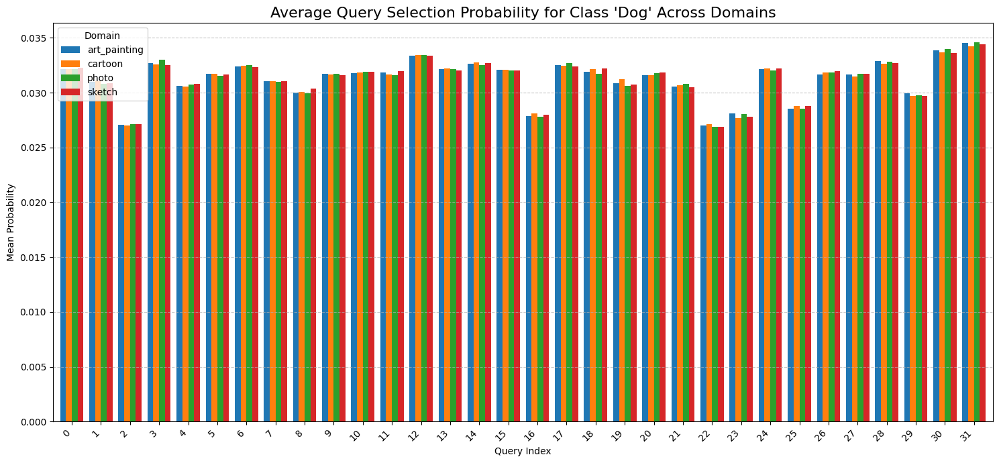

Saved probability score plot for class 'elephant' to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\prob_scores_class_elephant.png


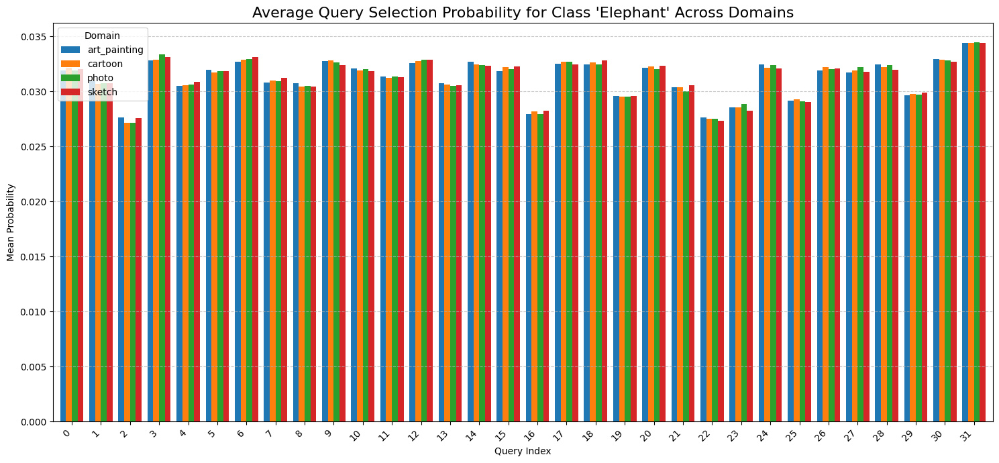

Saved probability score plot for class 'giraffe' to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\prob_scores_class_giraffe.png


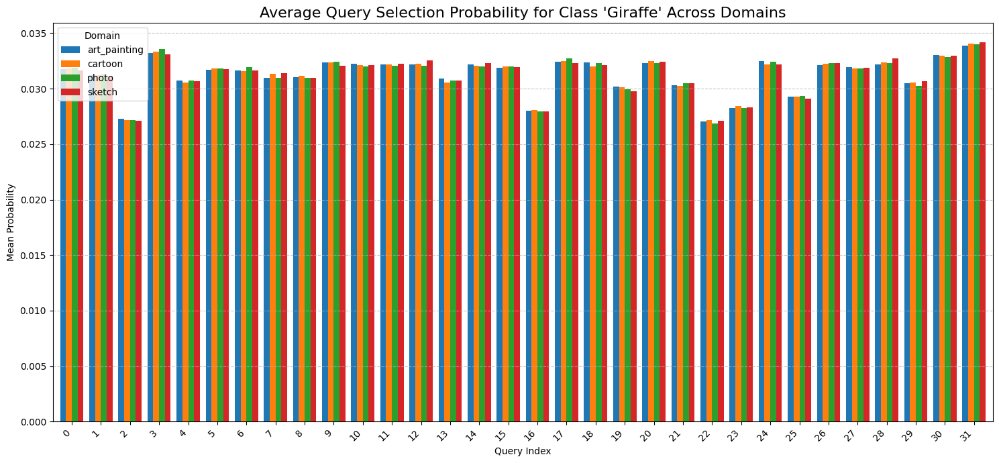

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Test 1: Analyzing Consistency of Query Selection (prob_scores) ---")

# --- 1. Function to Collect Scores (Corrected) ---
def collect_scores_and_labels(model, data_loader, device):
    model.eval() # This is important for disabling dropout, etc.
    all_prob_scores = []
    all_labels = []
    # We remove `with torch.no_grad()` because the model's forward pass
    # internally requires gradient computation for the reward proxy.
    for images, labels in tqdm(data_loader, desc="Collecting scores"):
        images = images.to(device)
        output_dict = model(images, labels.to(device))
        all_prob_scores.append(output_dict['prob_scores'].cpu())
        all_labels.append(labels.cpu())
    return torch.cat(all_prob_scores), torch.cat(all_labels)

# --- 2. Load Model and Collect Data for Each Domain ---
model_path = os.path.join(ckpt_root, "all_domain_model.pth")
if not os.path.exists(model_path):
    raise FileNotFoundError(f"Model not found at {model_path}. Please ensure Part 1 ran successfully.")

test_model = get_model(CFG, dataset="PACS").to(device)
test_model.load_state_dict(torch.load(model_path, map_location=device), strict=False)

domain_scores = {}
for domain in domains:
    print(f"\nProcessing domain: {domain}")
    domain_test_loader = pacs.get_dataloader(domain, train=False)
    prob_scores, labels = collect_scores_and_labels(test_model, domain_test_loader, device)
    
    df = pd.DataFrame(prob_scores.numpy())
    df['label'] = labels.numpy()
    domain_scores[domain] = df

print("\nCollected query selection probabilities for all domains.")

# --- 3. Analyze and Visualize the Results ---
class_names = CFG['datasets']['PACS']['classes']
classes_to_analyze = [0, 1, 2] 

for class_idx in classes_to_analyze:
    plt.figure(figsize=(15, 7))
    
    mean_scores_by_domain = {
        domain: df[df['label'] == class_idx].iloc[:, :-1].mean().values
        for domain, df in domain_scores.items()
    }
    
    plot_df = pd.DataFrame(mean_scores_by_domain)
    plot_df.index.name = 'Query Index'
    
    plot_df.plot(kind='bar', width=0.8, ax=plt.gca())
    
    class_name = class_names[class_idx]
    plt.title(f"Average Query Selection Probability for Class '{class_name.capitalize()}' Across Domains", fontsize=16)
    plt.ylabel("Mean Probability")
    plt.xlabel("Query Index")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title="Domain")
    plt.tight_layout()
    
    plot_path = os.path.join(plots_dir, f"prob_scores_class_{class_name}.png")
    plt.savefig(plot_path)
    print(f"Saved probability score plot for class '{class_name}' to {plot_path}")
    plt.show()


--- Analyzing Query Selection (prob_scores) for each LODO Model ---

==================== Analyzing Model Trained w/o 'Art_painting' ====================


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing test domain: art_painting (UNSEEN)



Processing test domain: cartoon (Source)



Processing test domain: photo (Source)



Processing test domain: sketch (Source)


Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_art_painting_scores_class_dog.png


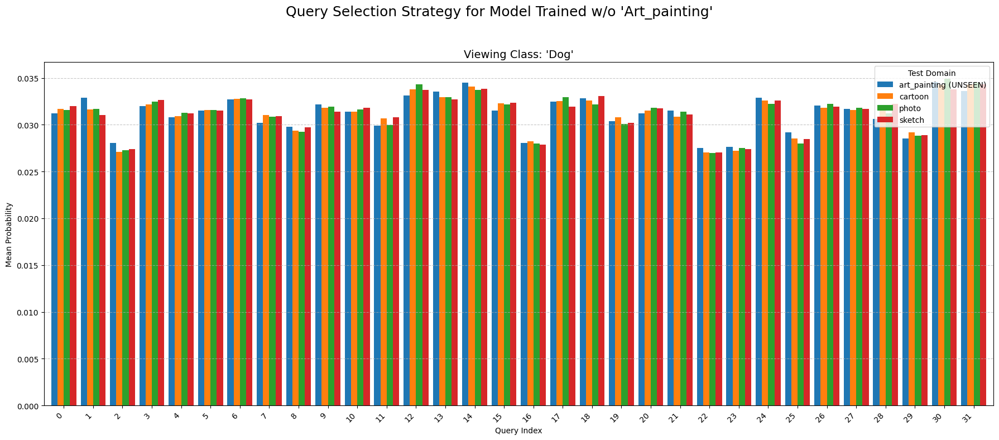

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_art_painting_scores_class_elephant.png


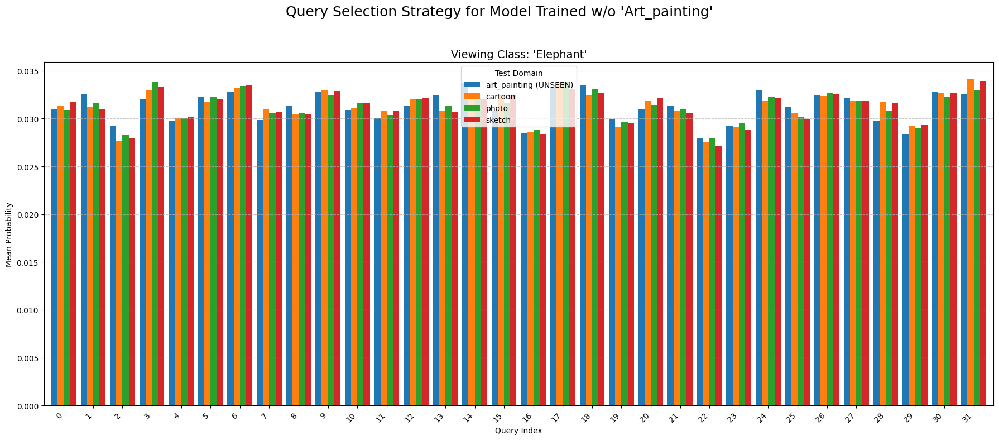

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_art_painting_scores_class_giraffe.png


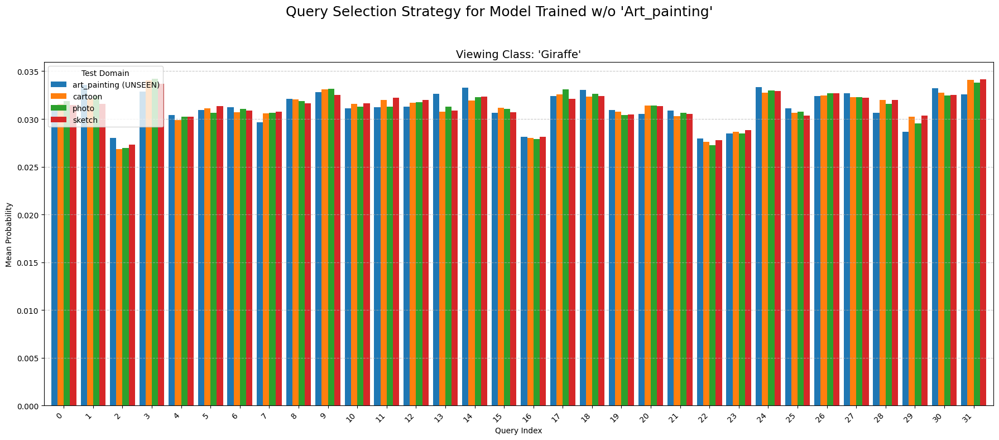


==================== Analyzing Model Trained w/o 'Cartoon' ====================


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing test domain: art_painting (Source)



Processing test domain: cartoon (UNSEEN)



Processing test domain: photo (Source)



Processing test domain: sketch (Source)


Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_cartoon_scores_class_dog.png


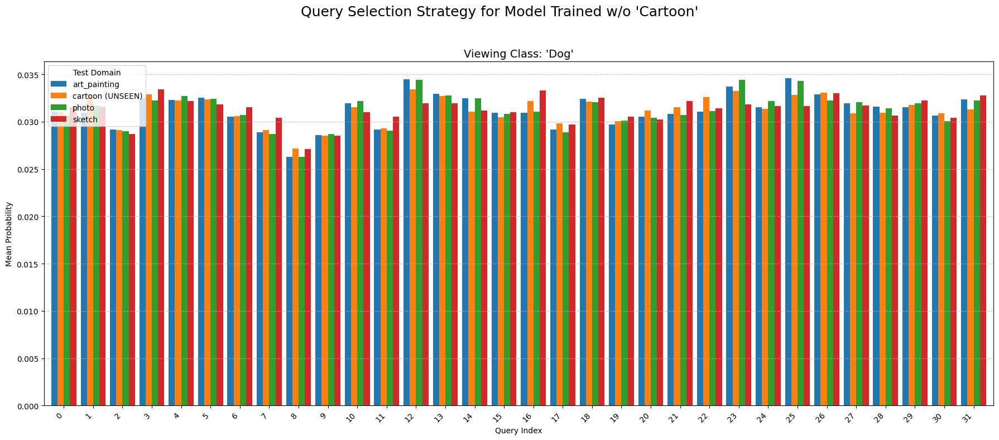

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_cartoon_scores_class_elephant.png


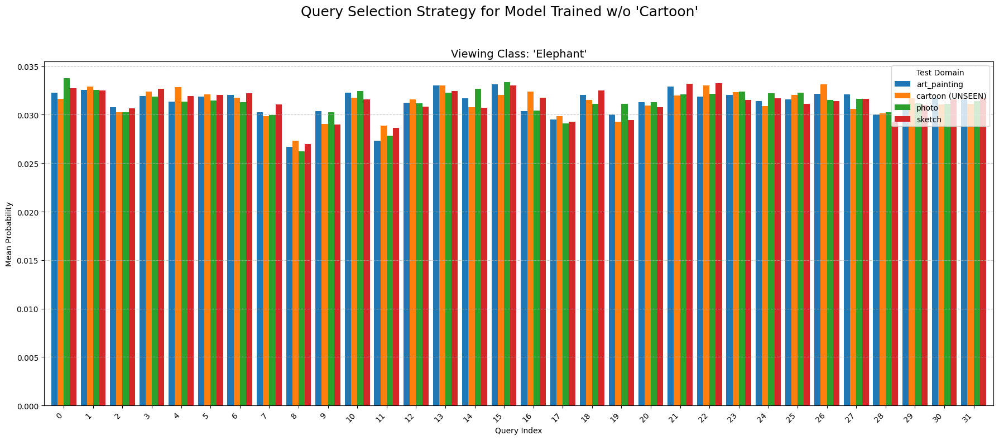

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_cartoon_scores_class_giraffe.png


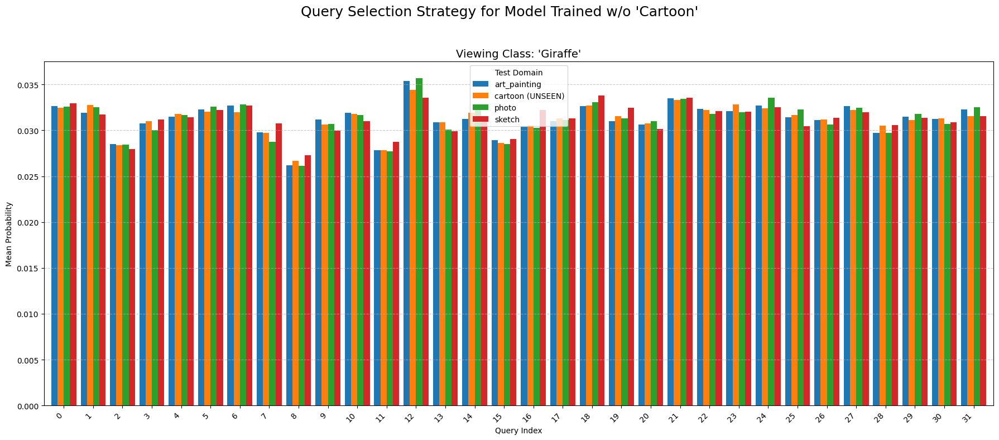


==================== Analyzing Model Trained w/o 'Photo' ====================


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing test domain: art_painting (Source)



Processing test domain: cartoon (Source)



Processing test domain: photo (UNSEEN)



Processing test domain: sketch (Source)


Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_photo_scores_class_dog.png


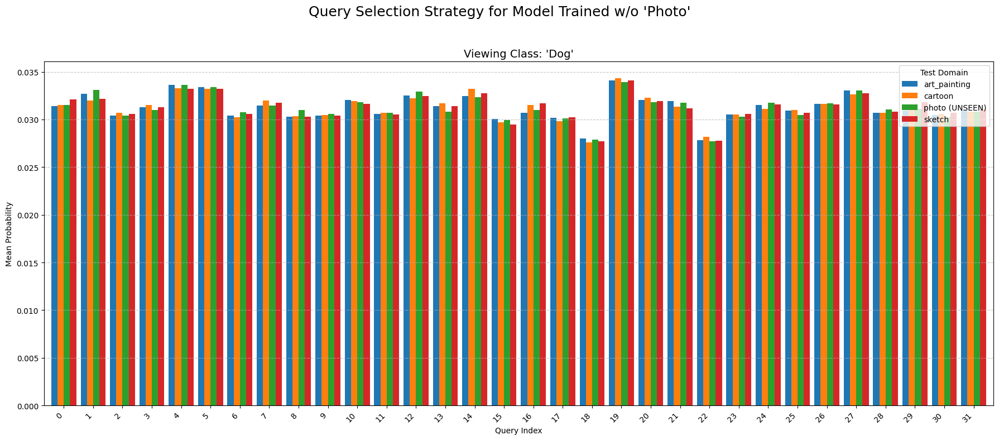

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_photo_scores_class_elephant.png


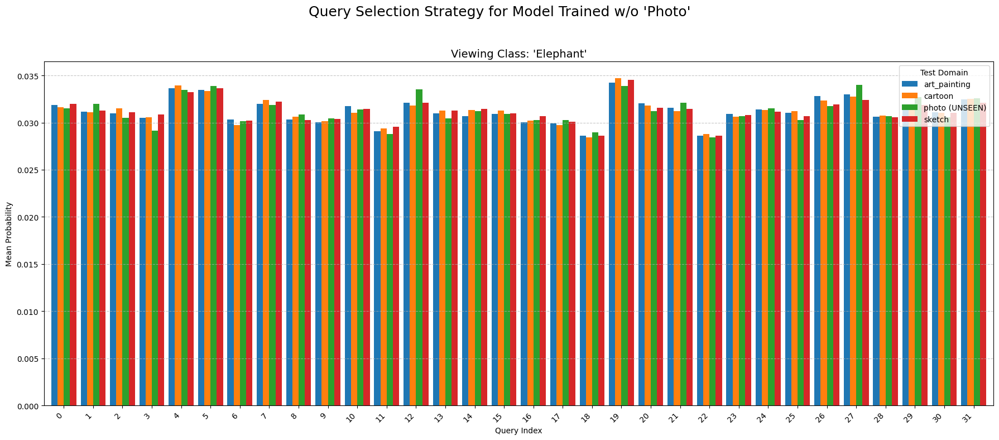

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_photo_scores_class_giraffe.png


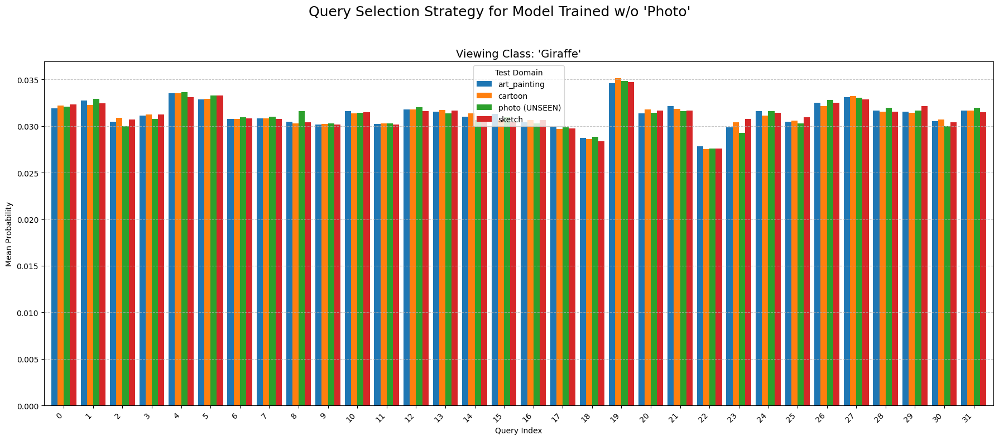


==================== Analyzing Model Trained w/o 'Sketch' ====================


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing test domain: art_painting (Source)



Processing test domain: cartoon (Source)



Processing test domain: photo (Source)



Processing test domain: sketch (UNSEEN)


Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_sketch_scores_class_dog.png


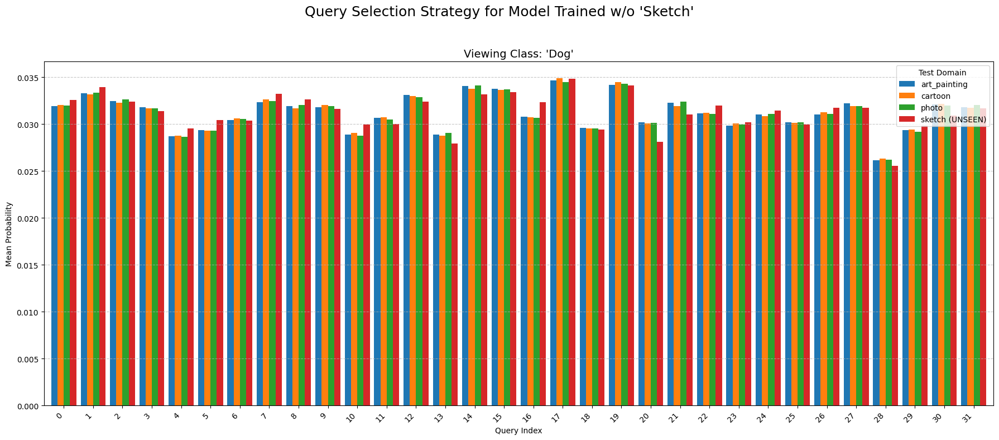

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_sketch_scores_class_elephant.png


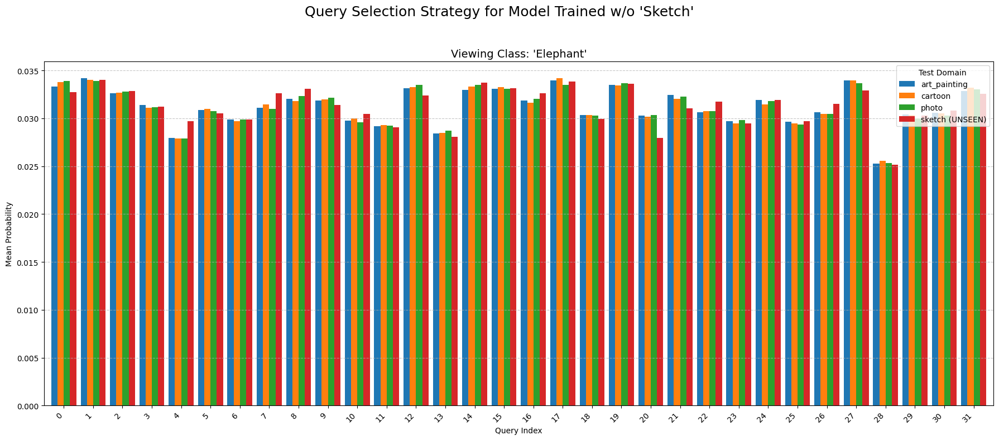

Saved LODO probability score plot to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\LODO_sketch_scores_class_giraffe.png


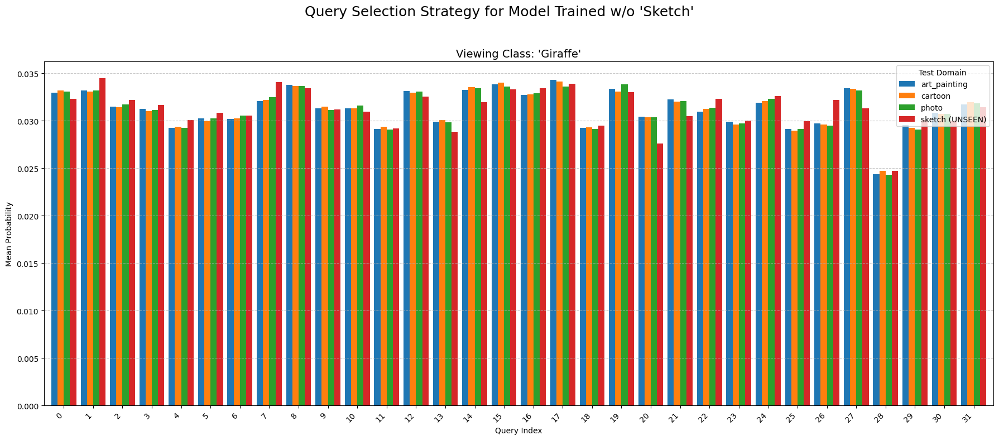

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Analyzing Query Selection (prob_scores) for each LODO Model ---")

# --- 1. Function to Collect Scores (Unchanged) ---
def collect_scores_and_labels(model, data_loader, device):
    model.eval()
    all_prob_scores = []
    all_labels = []
    # Gradients must be enabled for this model's forward pass to work
    for images, labels in tqdm(data_loader, desc="Collecting scores"):
        images = images.to(device)
        output_dict = model(images, labels.to(device))
        all_prob_scores.append(output_dict['prob_scores'].cpu())
        all_labels.append(labels.cpu())
    return torch.cat(all_prob_scores), torch.cat(all_labels)

# --- 2. Main Loop: Iterate Through Each LODO Model ---
class_names = CFG['datasets']['PACS']['classes']
classes_to_analyze = [0, 1, 2] # Dog, Elephant, Giraffe

# The outer loop defines which LODO model we are analyzing
for held_out_domain in domains:
    print(f"\n{'='*20} Analyzing Model Trained w/o '{held_out_domain.capitalize()}' {'='*20}")
    
    # --- Load the specific LODO model ---
    model_path = os.path.join(ckpt_root, f"best_{held_out_domain}.ckpt") # Or your checkpoint naming scheme
    if not os.path.exists(model_path):
        print(f"Model for held-out domain '{held_out_domain}' not found. Skipping.")
        continue
        
    lodo_model = get_model(CFG, dataset="PACS").to(device)
    lodo_model.load_state_dict(torch.load(model_path, map_location=device), strict=False)

    # --- Collect scores from this model on ALL FOUR domains ---
    domain_scores = {}
    # The inner loop tests the loaded model on each domain
    for test_domain in domains:
        is_unseen = "(UNSEEN)" if test_domain == held_out_domain else "(Source)"
        print(f"\nProcessing test domain: {test_domain} {is_unseen}")
        
        domain_test_loader = pacs.get_dataloader(test_domain, train=False)
        prob_scores, labels = collect_scores_and_labels(lodo_model, domain_test_loader, device)
        
        df = pd.DataFrame(prob_scores.numpy())
        df['label'] = labels.numpy()
        domain_scores[test_domain] = df

    # --- Analyze and Visualize for the current LODO model ---
    for class_idx in classes_to_analyze:
        plt.figure(figsize=(18, 8))
        
        mean_scores_by_domain = {
            domain: df[df['label'] == class_idx].iloc[:, :-1].mean().values
            for domain, df in domain_scores.items()
        }
        
        plot_df = pd.DataFrame(mean_scores_by_domain)
        # Highlight the unseen domain in the legend for clarity
        plot_df.rename(columns={held_out_domain: f"{held_out_domain} (UNSEEN)"}, inplace=True)
        plot_df.index.name = 'Query Index'
        
        plot_df.plot(kind='bar', width=0.85, ax=plt.gca())
        
        class_name = class_names[class_idx]
        plt.suptitle(f"Query Selection Strategy for Model Trained w/o '{held_out_domain.capitalize()}'", fontsize=18)
        plt.title(f"Viewing Class: '{class_name.capitalize()}'", fontsize=14)
        plt.ylabel("Mean Probability")
        plt.xlabel("Query Index")
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend(title="Test Domain")
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        
        plot_path = os.path.join(plots_dir, f"LODO_{held_out_domain}_scores_class_{class_name}.png")
        plt.savefig(plot_path)
        print(f"Saved LODO probability score plot to {plot_path}")
        plt.show()


--- Test 2: Visualizing Cross-Attention Maps (Corrected) ---


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Found example images for class 'dog' from all domains.
Saved attention map visualization for Query #0 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_0.png


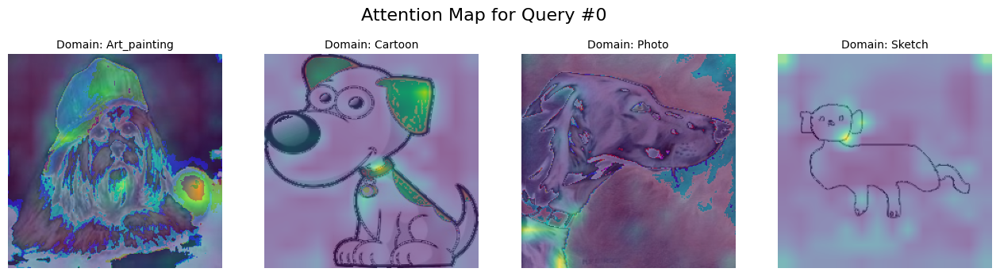

Saved attention map visualization for Query #5 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_5.png


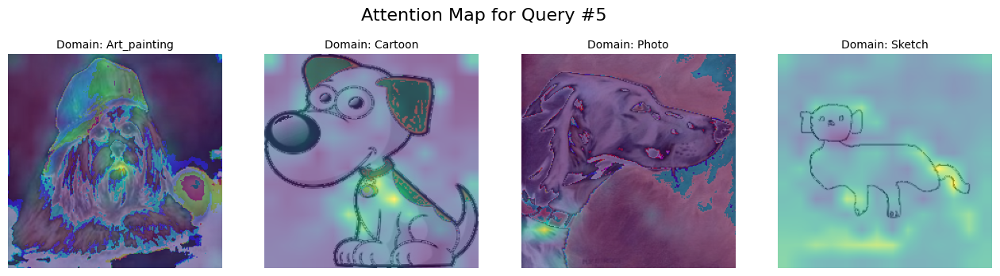

Saved attention map visualization for Query #31 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_31.png


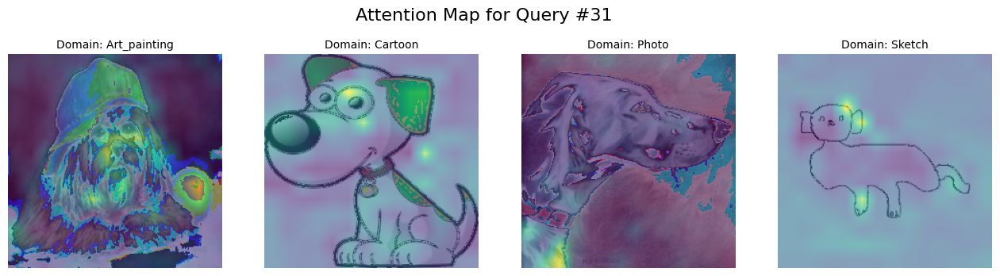

Saved attention map visualization for Query #3 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_3.png


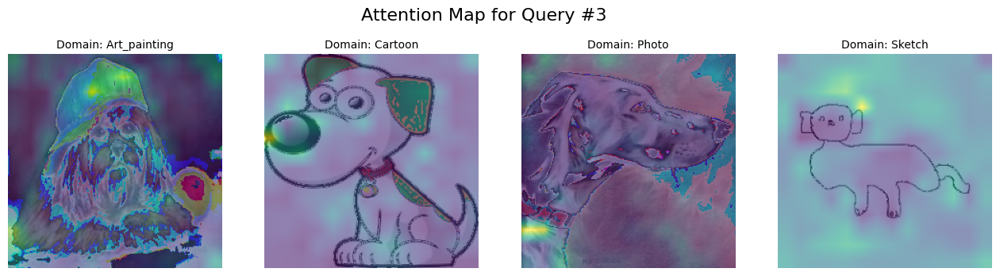

Saved attention map visualization for Query #12 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_12.png


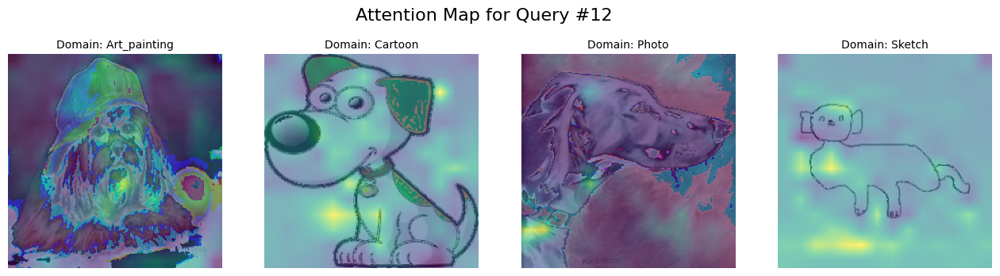

Saved attention map visualization for Query #17 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_17.png


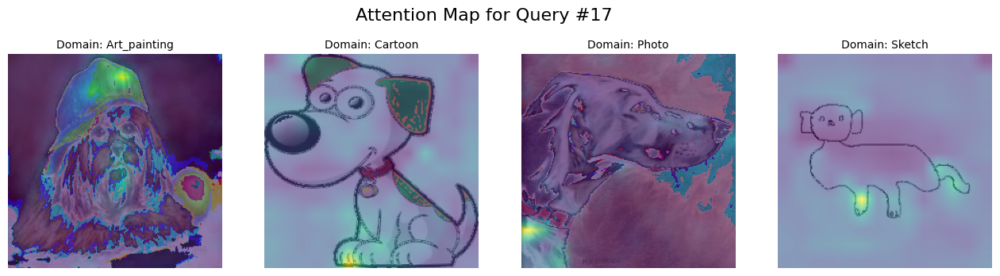

Saved attention map visualization for Query #24 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\attention_query_24.png


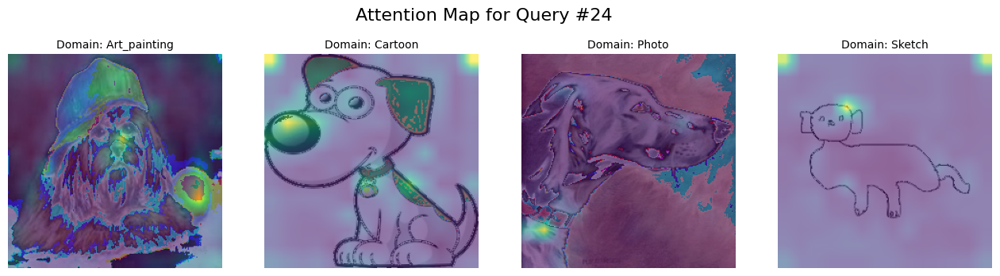

In [ ]:
import torch
import torch.nn.functional as F
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
import numpy as np

print("\n--- Test 2: Visualizing Cross-Attention Maps (Corrected) ---")

# --- 1. Load the Modified Model ---
# Ensure you have restarted the kernel after modifying the .py files
model_path = os.path.join(ckpt_root, "all_domain_model.pth")
if not os.path.exists(model_path):
    raise FileNotFoundError(f"Model not found at {model_path}. Please ensure Part 1 ran successfully.")

viz_model = get_model(CFG, dataset="PACS").to(device)
viz_model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
viz_model.eval()

# --- 2. Get Example Images of the Same Class ---
class_to_find = 0 # We'll look for 'dog' (class 0)
class_name = CFG['datasets']['PACS']['classes'][class_to_find]
example_images = {}
example_found = True

for domain in domains:
    domain_dataset = pacs.get_dataset(domain, train=False)
    found_in_domain = False
    for i in range(len(domain_dataset)):
        img, label = domain_dataset[i]
        if label == class_to_find:
            example_images[domain] = img
            found_in_domain = True
            break
    if not found_in_domain:
        print(f"Warning: Could not find an image for class '{class_name}' in domain '{domain}'.")
        example_found = False

if not example_found:
    print("Could not find examples in all domains. Skipping attention visualization.")
else:
    print(f"Found example images for class '{class_name}' from all domains.")

    # --- 3. Visualization Function and Loop (Corrected) ---
    # --- CHANGE 1: Function now accepts class_idx ---
    def visualize_attention(model, image_tensor, query_idx_to_viz, class_idx, device, ax, title):
        image_tensor = image_tensor.unsqueeze(0).to(device)
        # --- CHANGE 2: Create a label tensor and pass it to the model ---
        label_tensor = torch.tensor([class_idx], device=device)
        
        # The model's forward pass now receives the correct label
        output_dict = model(image_tensor, labels=label_tensor)
        
        # Attention map shape: [Batch, Num_Queries, Num_Patches] -> [1, 32, 196]
        attn_map = output_dict['attention_map']

        # Get map for our query and reshape
        query_attn = attn_map[0, query_idx_to_viz, :].cpu() # Shape: [196]
        heatmap = query_attn.reshape(14, 14)
        
        # Resize heatmap to original image size for overlay
        resized_heatmap = F.interpolate(heatmap.unsqueeze(0).unsqueeze(0),
                                        size=(224, 224),
                                        mode='bilinear',
                                        align_corners=False).squeeze()
        
        # Plotting
        img_pil = to_pil_image(image_tensor.squeeze(0).cpu())
        ax.imshow(img_pil)
        ax.imshow(resized_heatmap, cmap='viridis', alpha=0.6)
        ax.set_title(title, fontsize=10)
        ax.axis('off')

    # Visualize attention for a few different queries to see if they specialize
    queries_to_visualize = [0, 5, 31, 3, 12, 17, 24] 
    for query_idx in queries_to_visualize:
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        fig.suptitle(f"Attention Map for Query #{query_idx}", fontsize=16)
        
        for ax, domain in zip(axes, domains):
            # --- CHANGE 3: Pass the class_to_find to the function ---
            visualize_attention(viz_model, example_images[domain], query_idx, class_to_find, device, ax, f"Domain: {domain.capitalize()}")
        
        plot_path = os.path.join(plots_dir, f"attention_query_{query_idx}.png")
        plt.savefig(plot_path)
        print(f"Saved attention map visualization for Query #{query_idx} to {plot_path}")
        plt.show()


--- The Ultimate Test: Source vs. Unseen Target Domain Adaptation ---
Found example images for class 'dog' from all domains.


Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: 

Saved Source vs. Target adaptation plot for Query #3 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\ADAPTATION_query_3.png


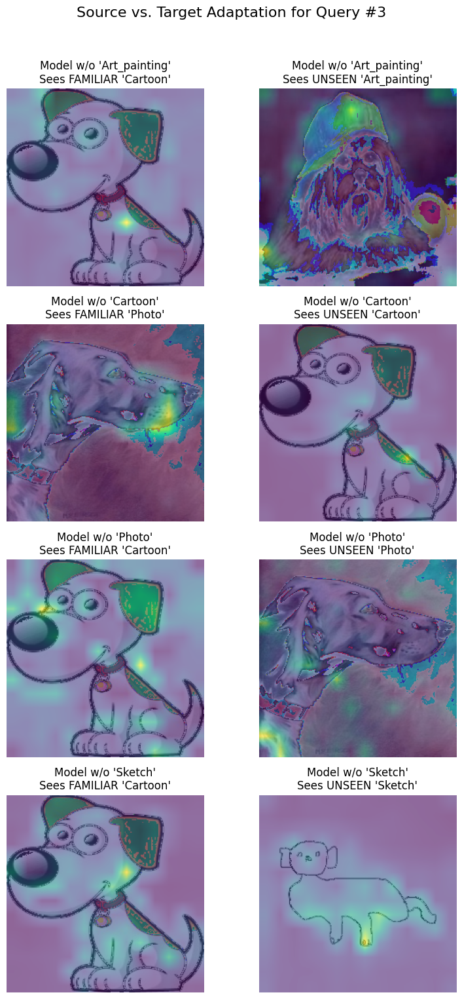

Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: 

Saved Source vs. Target adaptation plot for Query #12 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\ADAPTATION_query_12.png


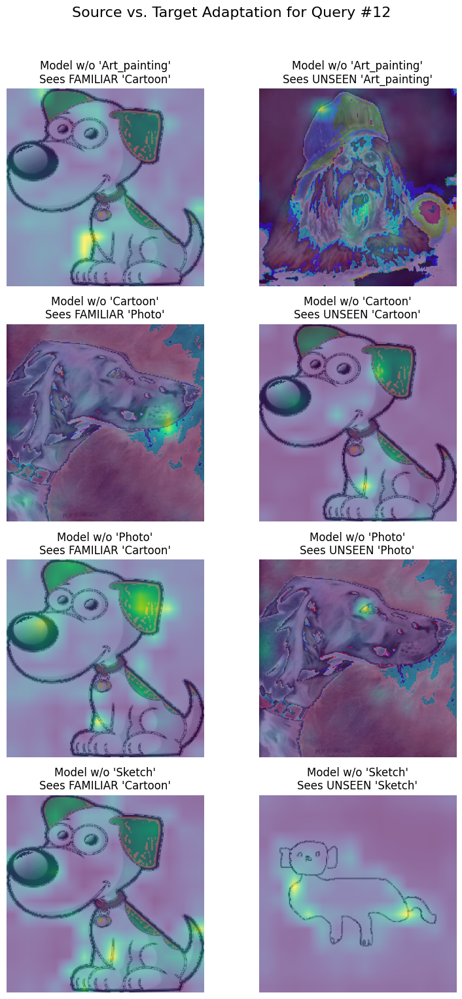

Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: 

Saved Source vs. Target adaptation plot for Query #17 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\ADAPTATION_query_17.png


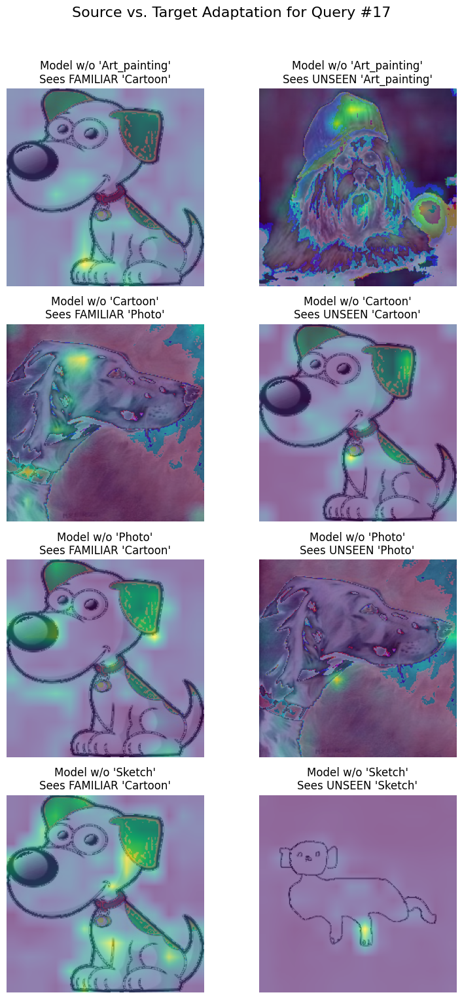

Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ViTModel were not initialized from the model checkpoint at WinKawaks/vit-tiny-patch16-224 and are newly initialized: 

Saved Source vs. Target adaptation plot for Query #24 to c:\Users\Fatim_Sproj\Desktop\Fatim\Spring 2025\sproj\Visual-Reasoning\Vit-GRQO\vit-tiny\PACS\plots\ADAPTATION_query_24.png


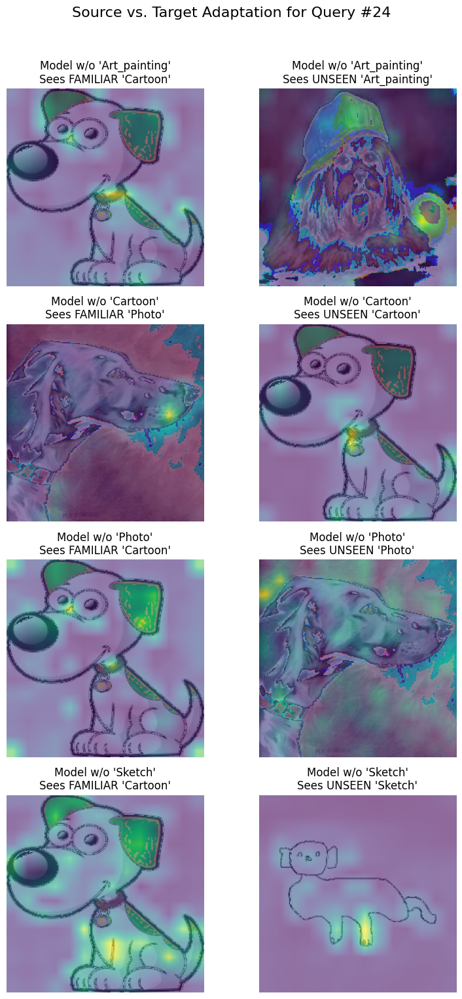

In [ ]:
import torch
import torch.nn.functional as F
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
import numpy as np

print("\n--- The Ultimate Test: Source vs. Unseen Target Domain Adaptation ---")

# --- 1. Get Example Images (Same as before) ---
class_to_find = 0 # 'dog'
class_name = CFG['datasets']['PACS']['classes'][class_to_find]
example_images = {}
for domain in domains:
    domain_dataset = pacs.get_dataset(domain, train=False)
    for i in range(len(domain_dataset)):
        img, label = domain_dataset[i]
        if label == class_to_find:
            example_images[domain] = img
            break

print(f"Found example images for class '{class_name}' from all domains.")

# --- 2. Visualization Function (Same as before) ---
def visualize_attention(model, image_tensor, query_idx_to_viz, class_idx, device, ax, title):
    image_tensor = image_tensor.unsqueeze(0).to(device)
    label_tensor = torch.tensor([class_idx], device=device)
    
    output_dict = model(image_tensor, labels=label_tensor)
    attn_map = output_dict['attention_map']
    query_attn = attn_map[0, query_idx_to_viz, :].cpu()
    heatmap = query_attn.reshape(14, 14)
    resized_heatmap = F.interpolate(heatmap.unsqueeze(0).unsqueeze(0),
                                    size=(224, 224),
                                    mode='bilinear',
                                    align_corners=False).squeeze()
    
    img_pil = to_pil_image(image_tensor.squeeze(0).cpu())
    ax.imshow(img_pil)
    ax.imshow(resized_heatmap, cmap='viridis', alpha=0.6)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

# --- 3. The Source vs. Target Visualization Loop ---
queries_to_visualize = [3, 12, 17, 24]
source_domains_to_show = ["cartoon", "photo", "sketch", "art_painting"] # Define a consistent source for comparison

for query_idx in queries_to_visualize:
    # Create a 4x2 grid of plots. Each row corresponds to one LODO model.
    fig, axes = plt.subplots(4, 2, figsize=(8, 16))
    fig.suptitle(f"Source vs. Target Adaptation for Query #{query_idx}", fontsize=16, y=0.95)

    # Iterate through each LODO model, defined by its held-out (target) domain
    for i, target_domain in enumerate(domains):
        # --- Define Source and Target ---
        # Pick a source domain that is NOT the target domain
        source_domain = next(d for d in source_domains_to_show if d != target_domain)
        
        # --- Load the Correct LODO Model ---
        model_path = os.path.join(ckpt_root, f"best_{target_domain}.ckpt")
        if not os.path.exists(model_path):
            axes[i, 0].set_title(f"Model for {target_domain} not found")
            axes[i, 0].axis('off')
            axes[i, 1].set_title("")
            axes[i, 1].axis('off')
            continue
            
        lodo_model = get_model(CFG, dataset="PACS").to(device)
        lodo_model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
        lodo_model.eval()

        # --- Visualize on Source Domain (Left Column) ---
        source_image = example_images[source_domain]
        source_title = f"Model w/o '{target_domain.capitalize()}'\nSees FAMILIAR '{source_domain.capitalize()}'"
        visualize_attention(lodo_model, source_image, query_idx, class_to_find, device, axes[i, 0], source_title)

        # --- Visualize on Target Domain (Right Column) ---
        target_image = example_images[target_domain]
        target_title = f"Model w/o '{target_domain.capitalize()}'\nSees UNSEEN '{target_domain.capitalize()}'"
        visualize_attention(lodo_model, target_image, query_idx, class_to_find, device, axes[i, 1], target_title)
    
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plot_path = os.path.join(plots_dir, f"ADAPTATION_query_{query_idx}.png")
    plt.savefig(plot_path)
    print(f"Saved Source vs. Target adaptation plot for Query #{query_idx} to {plot_path}")
    plt.show()